<a href="https://colab.research.google.com/github/Rajat504/CLOUDYML/blob/main/Sound_Classification_%26_Recommender_withoutcode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <h1><center> **Audio Visualization, Prediction and Recommendation System**</center></h1>

Use this channel [ValerioVelardoTheSoundofAI](https://www.youtube.com/c/ValerioVelardoTheSoundofAI) to know everything about Audio Processing, Classification, Research, Augmentation, etc.

# **Assignment Overview**
* Audio Visualization
* Audio Classification
* Audio Recommendation

# **This assignment contains**
1. Dataset link
2. Importing the libraries
3. Finding all the classes in our train dataset
4. Audio Preprocessing
5. Fourier Transformation( using Short Time Fourier Transform STFT)
6. Spectrogram
7. Audio Features
8. Tempo Beats per minute
9. Spectral Centroid
10. Mel Frequency Cepstral Coefficients (MFCCs) Feature Extraction
11. Exploratory Data Analysis
12. Performing Principal Component Analysis(PCA) on all classes
13. Create the model
14. Choose the model with best accuracy
15. Predict the model
16. Create the function to predict the model
17. Feature Importance
18. Building the Recommendation System
19. Cosine similarity
20. Predicting the audio recommendations we got above.











# Dataset link:
https://www.kaggle.com/andradaolteanu/gtzan-dataset-music-genre-classification

In [ ]:
#mounting the drive so that we can fetch data from google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing the libraries

* pandas is the most powerful and flexible open source data analysis/manipulation tool available in any language
* Using NumPy, mathematical and logical operations on arrays can be performed.
* Seaborn is an open-source Python library built on top of matplotlib. It is used for data visualization and exploratory data analysis. Seaborn works easily with dataframes and the Pandas library. The graphs created can also be customized easily.
* TensorFlow is an end-to-end open source platform for machine learning. It has a comprehensive, flexible ecosystem of tools, libraries and community resources that lets researchers push the state-of-the-art in ML and developers easily build and deploy ML powered applications.
* Read [sklearn](https://scikit-learn.org/stable/) docs to perform ML operations

In [ ]:
# Import required libraries
# import pandas for data analysing
import pandas as pd
# import numpy to solve mathematical operations
import numpy as np
# import seaborn to do data visualization
import seaborn as sns
# import matplotlib to plot different mathematical graphs and plots
import matplotlib.pyplot as plt
# import tensorflow to perform ML processes
import tensorflow as tf
from sklearn import preprocessing
# use %matplotlib inline to use matplotlib in jupyter notebook and colab
%matplotlib inline

# import sklearn to perform ML


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

##Read this documentation for more information on librosa and better understanding of this notebook:-
* https://librosa.org/doc/latest/tutorial.html
* ipython.display - Create an audio object. When this object is returned by an input cell or passed to the display function, it will result in Audio controls being displayed in the frontend (only works in the notebook)
*

In [ ]:
# importing the librosa library
import librosa
import IPython.display as ipd


# import librosa.display to display audio as a waves
import librosa.display


# import IPython.display as ipd, which  lets you play audio directly in an IPython notebook
import IPython.display as ipd


# import warnings- Warnings are provided to warn the developer of situations that aren't necessarily exceptions.
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# move to the folder where you want to store the project
%cd /content/drive/MyDrive/cloudyML/audio visualization

[Errno 2] No such file or directory: '/content/drive/MyDrive/cloudyML/audio visualization'
/content


* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

* Using **librosa** as a audio processing library.
* [**librosa**](https://librosa.org/doc/latest/core.html#module-librosa) is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.

In [ ]:
# Unzip the dataset and then comment out this line
!unzip "/content/drive/MyDrive/Colab Notebooks/Music recommendation system/music /GTZAN_dataset.zip"

unzip:  cannot find or open /content/drive/MyDrive/Colab Notebooks/Music recommendation system/music /GTZAN_dataset.zip, /content/drive/MyDrive/Colab Notebooks/Music recommendation system/music /GTZAN_dataset.zip.zip or /content/drive/MyDrive/Colab Notebooks/Music recommendation system/music /GTZAN_dataset.zip.ZIP.


#Finding all the classes in our train dataset

In [ ]:
# import os
import os


# move to folder where your data is stored , set location of data in general path
general_path = "/content/drive/MyDrive/cloudyML/audio visualization/GTZAN_dataset"

# print all the classes using os.listdir you have in the dataset using f'{general_path}/genres_original/'
print(os.listdir('/content/sample_data'))


['anscombe.json', 'README.md', 'california_housing_test.csv', 'mnist_test.csv', 'california_housing_train.csv', 'mnist_train_small.csv']


# Audio Preprocessing

Watch this [reference](https://www.youtube.com/watch?v=Oa_d-zaUti8&ab_channel=ValerioVelardo-TheSoundofAI)
 video below:

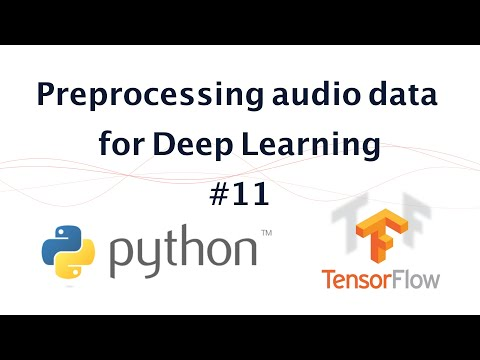

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('Oa_d-zaUti8', width=600, height=300)


In [ ]:
# Importing 1 sample file(disco.00004.wav), for audio visualization
audio_file_path = f'{general_path}/genres_original/disco/disco.00004.wav'

#  Load the audio as a waveform `y` using librosa.load
#  Store the sampling rate as `sr`
y,sr = librosa.load('/content/reggae.00084.wav')

# print y, y.shape and sr
print ("y: ", y)
print ("y.shape: ", y.shape)
print ("sr: ", sr)





# Verify length of the audio (y.shape/sample rate)
len



y:  [-0.00796509  0.01934814  0.04452515 ...  0.19561768  0.21774292
  0.23886108]
y.shape:  (661504,)
sr:  22050


<function len(obj, /)>

[librosa.effects.trim](https://librosa.org/doc/latest/generated/librosa.effects.trim.html#librosa.effects.trim)
* for removing noise in corner cases i.e begining and end of actual audio.

In [ ]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# print audio_file and audio_file.shape
print(audio_file)

# the result is an numpy ndarray, print audio_file
#print(audio_file)


# print shape of audio
print(audio_file.shape)





[-0.00796509  0.01934814  0.04452515 ...  0.19561768  0.21774292
  0.23886108]
(661504,)


[librosa.display.waveplot](https://librosa.org/doc/latest/generated/librosa.display.waveplot.html#librosa.display.waveplot)
* Plot the amplitude envelope of a waveform.

* If y is monophonic, a filled curve is drawn between [-abs(y), abs(y)].

* If y is stereo, the curve is drawn between [-abs(y[1]), abs(y[0])], so that the left and right channels are drawn above and below the axis, respectively.

* Long signals (duration >= max_points) are down-sampled to at most max_sr before plotting.

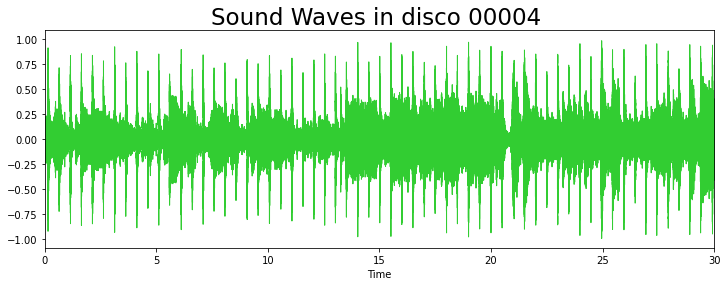

In [ ]:
# set graph size using plt.figure
plt.figure

#Plot the amplitude envelope of a waveform using librosa.display.waveplot
librosa.display.waveplot(audio_file, sr=sr)

# plot the title of sound wave
plt.title("Sound Wave")



Read this documentation before moving ahead
https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.wavfile.read.html

In [ ]:
# import wavfile as wav from scipy.io
from scipy.io import wavfile


# Open a WAV file(use audio_file_path)
# Return the sample rate (in samples/sec) and data from an LPCM WAV file.
wave_sample_rate, wave_audio = wavfile.read(audio_file_path)

# print wave_sample_rate and wave_audio
print(wave_sample_rate)
print(wave_audio)
wave_audio

array([   86,   567,  -591, ..., -4770, -4733, -1065], dtype=int16)

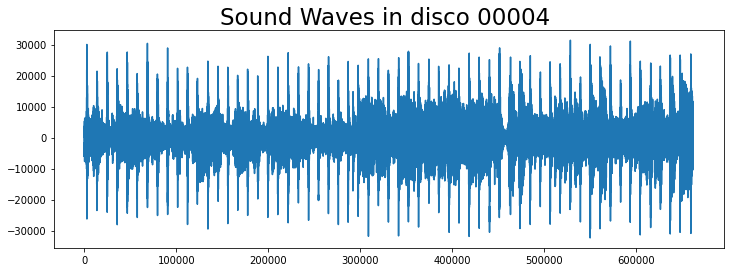

In [ ]:
# set figure size
plt.figure(figsize = (16, 6))

# Plot the amplitude envelope of a waveform using librosa.display.waveplot
librosa.display.waveplot(wave_audio, sr=wave_sample_rate)


# plot the audio as a wave graph
plt.title("Sound Wave")


# plot the title of graph
plt.title("Sound Wave")


# **Fourier Transformation( using Short Time Fourier Transform STFT)**

## **1. Fourier Transform**
* Decompose complex periodic sound into sum of sine waves oscillating at
different frequencies
* From time domain to frequency domain
* No time information

<a href="https://ibb.co/SnB9xyD"><img src="https://i.ibb.co/xj6RsLK/1.jpg" alt="1" border="0"></a>

Note:- The "Fast Fourier Transform" (FFT) is an important measurement method in the science of audio and acoustics measurement. It converts a signal into individual spectral components and thereby provides frequency information about the signal.

## **2. Short-time Fourier transform (STFT)**
[Short-time Fourier transform (STFT)](http://librosa.org/doc/main/generated/librosa.stft.html).

* The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows.
* Computes several FFT at different intervals
* Preserves time information
* Fixed frame size (e.g., 2048 samples)
* Gives a spectrogram (time + frequency + magnitude)

**Step 1**<br><a href="https://ibb.co/Jq06v1K"><img src="https://i.ibb.co/68V9HMm/2.jpg" alt="2" border="0"></a>

**Step 2**
<br>
<a href="https://ibb.co/1qNQxht"><img src="https://i.ibb.co/wWqg13F/3.jpg" alt="3" border="0"></a>

In [ ]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# set abs value of librosa.stft and pass audio_file, n_fft and hop_length (Short-time Fourier transform (STFT))
D = np.abs(librosa.stft(audio_file, n_fft=n_fft, hop_length=hop_length))

# print shape of D
print(D.shape)


Shape of D object: (1025, 1293)


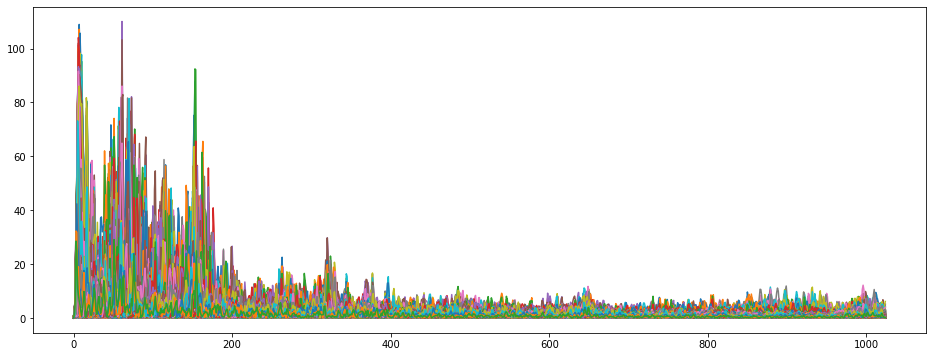

In [ ]:
# plot D
plt.figure(figsize = (16, 6))
plt.plot(D);

#**Spectrogram**

A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform.

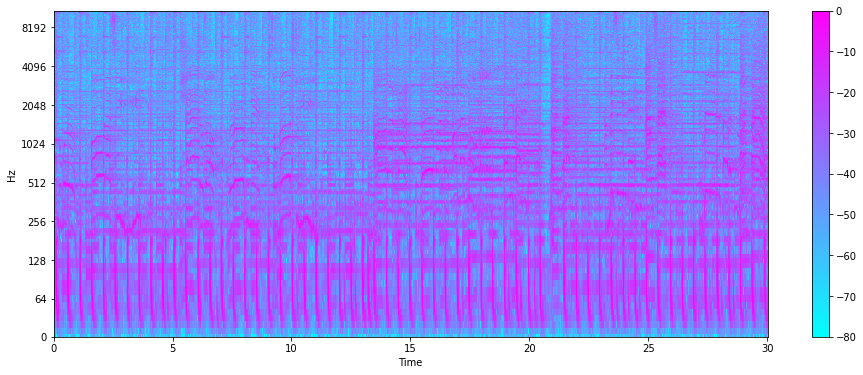

In [ ]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram. i.e. use librosa.amplitude_to_db
DB = librosa.amplitude_to_db(D, ref=np.max)

# print shape of DB
print(DB.shape)

# Creating the Spectogram, use library.display.specshow
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log');

# The colorbar() function in pyplot module of matplotlib adds a colorbar to a plot indicating the color scale.
plt.colorbar();


#Mel Spectrogram

Watch Video Explanation of [Mel Spectrogram](https://youtu.be/9GHCiiDLHQ4)


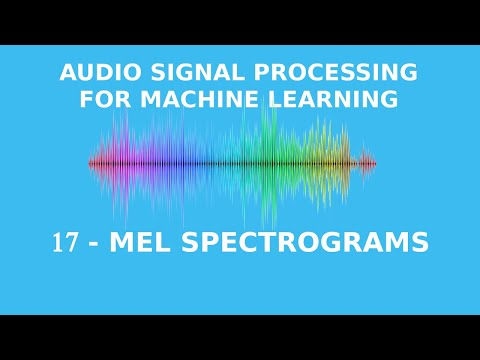

In [ ]:
YouTubeVideo('9GHCiiDLHQ4', width=600, height=300)

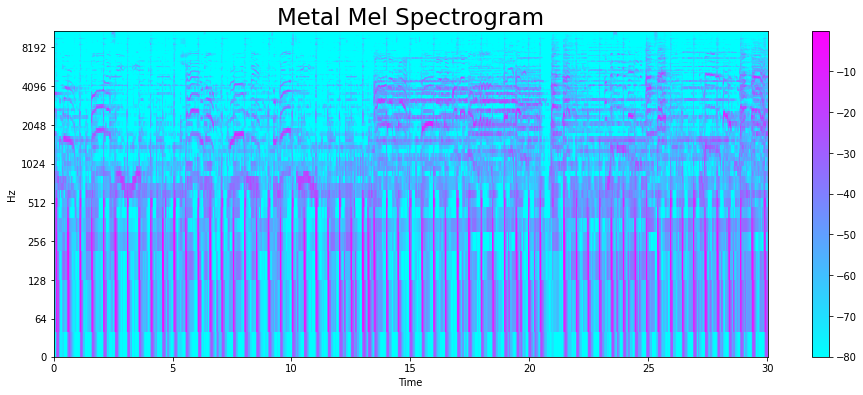

In [ ]:
# load the dataset path, hint - f'{general_path}/genres_original/disco/disco.00004.wav'
y, sr = librosa.load(f'{general_path}/genres_original/disco/disco.00004.wav')

# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
y, _ = librosa.effects.trim(y)

# Compute a mel-scaled spectrogram.
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                    fmax=8000)

# Convert an amplitude spectrogram to dB-scaled spectrogram.
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# plot the spectrogram figure
plt.figure(figsize = (16, 6))

# display metal mel spectrogram
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log');



# The colorbar() function in pyplot module of matplotlib adds a colorbar to a plot indicating the color scale.
plt.colorbar();

# plot the title
plt.title("Metal Mel Spectrogram", fontsize = 23);

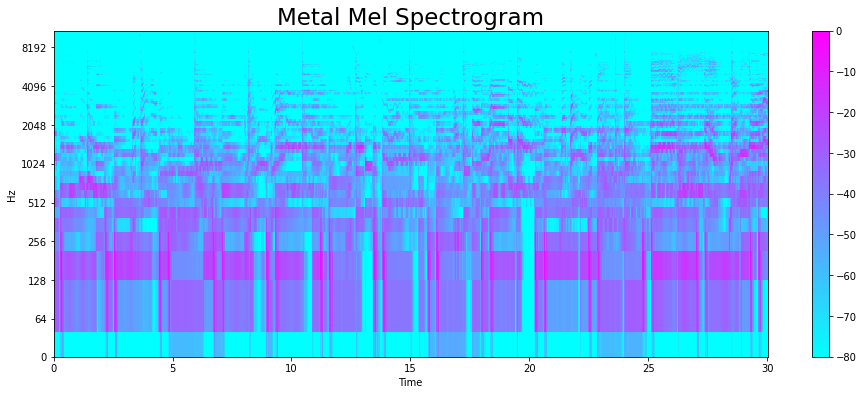

In [ ]:
# load the dataset path
y, sr = librosa.load(f'{general_path}/genres_original/metal/metal.00004.wav')

# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
y, _ = librosa.effects.trim(y)

# Compute a mel-scaled spectrogram.
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                    fmax=8000)

# Convert an amplitude spectrogram to dB-scaled spectrogram.
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# plot the spectrogram figure
plt.figure(figsize = (16, 6))

# display metal mel spectrogram
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log');


# The colorbar() function in pyplot module of matplotlib adds a colorbar to a plot indicating the color scale.
plt.colorbar();

# plot the title
plt.title("Metal Mel Spectrogram", fontsize = 23);

#Audio Features

In [ ]:
# Total zero_crossings in our 1 song, use librosa.zero_crossings
zero_crossings = librosa.zero_crossings(audio_file)

# print sum of zero_crossings
print(sum(zero_crossings))


112005


**librosa.effects.hpss(audio_file)**
<br>
This function automates the STFT->HPSS->ISTFT pipeline, and ensures that the output waveforms have equal length to the input waveform y

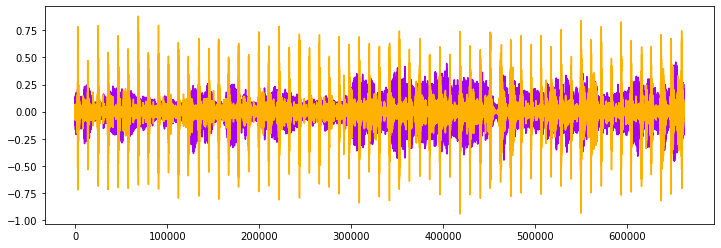

In [ ]:
# Decompose an audio time series into harmonic and percussive components, use librosa.effects.hpss and pass audio_file
y_harm, y_perc = librosa.effects.hpss(audio_file)

# print y_harm and y_perc
print(y_harm)
print(y_perc)

# set figure size and plot y_harm and y_perc with color = '#A300F9' & color = '#FFB100'
plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9')
plt.plot(y_perc, color = '#FFB100')





#Tempo Beats per minute
Beats are detected in three stages, following the method of:

1. Measure onset strength

2. Estimate tempo from onset correlation

3. Pick peaks in onset strength approximately consistent with estimated tempo

In [ ]:
# use librosa.beat.beat_track and pass y and sr
tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

# print tempo
print(tempo)


161.4990234375

#Spectral Centroid

In [ ]:
# Calculate the Spectral Centroids using librosa.feature.spectral_centroid
spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]

# print spectral_centroids
print(spectral_centroids)



# print shape of spectral_centroids
print(spectral_centroids.shape)



# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds) using librosa.frame_to_time
t = librosa.frames_to_time(frames)

# print frames
print(frames)

# print t
print(t)


# define function normalize which takes data to normalize and its axis (use minmax_scale from sklearn.preprocessing)
def normalize(x, axis=0):
    return preprocessing.minmax_scale(x, axis=axis)


# code here

    # code here


Centroids: [2810.30660397 2874.57677477 2967.48424963 ... 3038.02876297 2892.61804585
 2874.8833304 ] 

Shape of Spectral Centroids: (1293,) 

frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


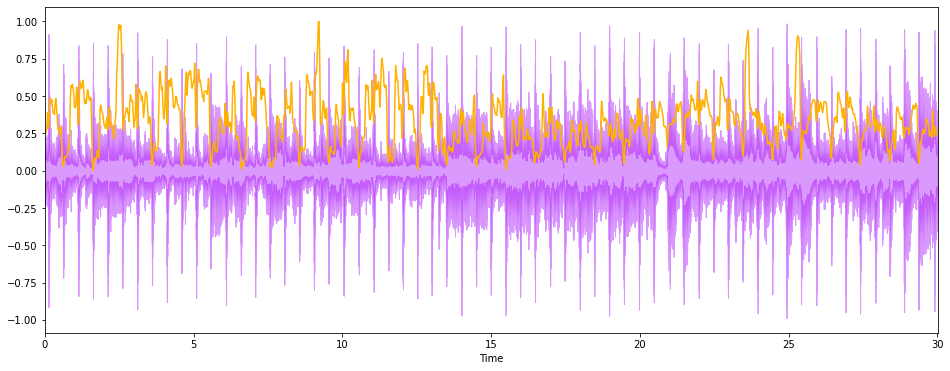

In [ ]:
#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (16, 6))

# display the waveplot using librosa.display.waveplot
librosa.display.waveplot(y, sr=sr, alpha=0.4)

# plotting the centroids on the spectrogram
plt.plot(t, normalize(spectral_centroids), color='r')


# plot by passing t and normalize(spectral_centroids with colot '#FFB100')
plt.plot(t, normalize(spectral_centroids), color='#FFB100')

# plot the title of graph
plt.title("Spectral Centroid")



# Mel Frequency Cepstral Coefficients (MFCCs) Feature Extraction

**Applications of MFCCs**
* Speech recognition
* Music genre classification
* Music instrument classification

**Properties of MFCCs**
* Capture timbral/textural aspects of sound
* Frequency domain feature
* Approximate human auditory system
* 13 to 40 coefficients
* Calculated at each frame

<a href="https://ibb.co/BsGXxWw"><img src="https://i.ibb.co/kcJRfbM/4.jpg" alt="4" border="0"></a>

For learning more on Feature extraction for audio read https://librosa.org/doc/latest/feature.html

mfccs shape: (20, 1293)


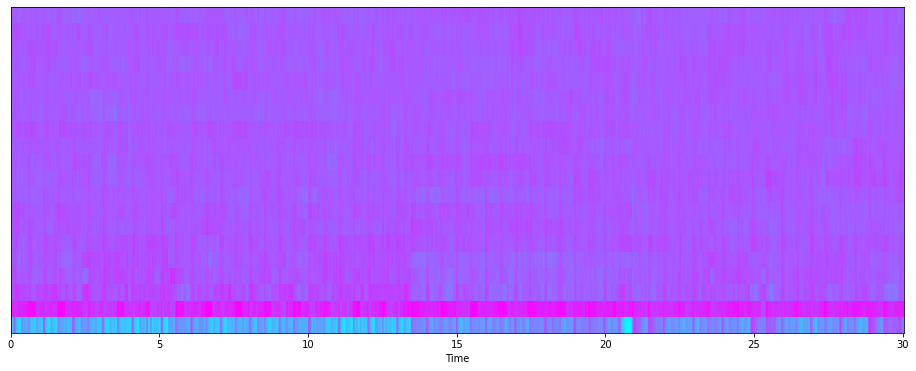

In [ ]:
# Get more components, use librosa.feature.mfcc
mfccs = librosa.feature.mfcc(y, sr=sr)

# print shape of mfccs
print(mfccs.shape)

#Displaying  the MFCCs:
plt.figure(figsize = (16, 6))
# displaying the MFCCs using librosa.display.specshow
librosa.display.specshow(mfccs, sr=sr, hop_length=hop_length);



Mean: 4.72043e-09 

Var: 1.0000001


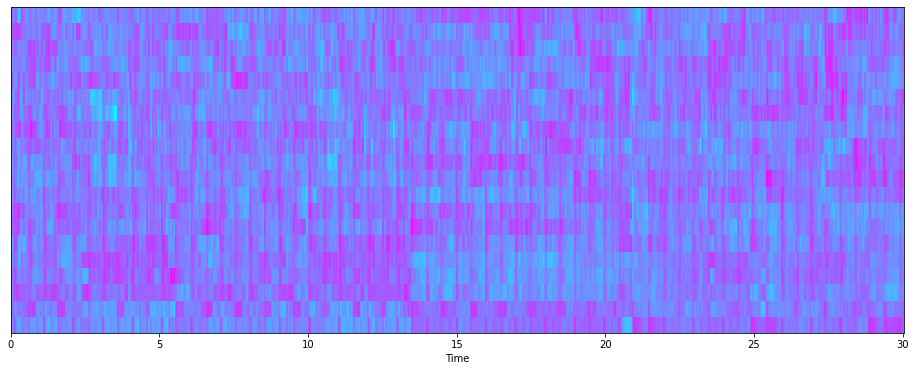

In [ ]:
# Perform Feature Scaling using preprocessing.scale
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)

# print shape of mfccs
print(mfccs.shape)

# finding the mean of mfccs
print(np.mean(mfccs))


# finding the variance of mfccs
print(np.var(mfccs))


# setting the figure size
plt.figure(figsize = (16, 6))

# displaying the MFCCs using specshow
librosa.display.specshow(mfccs, sr=sr, hop_length=hop_length);



#**Exploratory Data Analysis**

In [ ]:
#read the csv file for input dataset f'{general_path}/features_30_sec.csv'
data = pd.read_csv(f'{general_path}/features_30_sec.csv')

#data.head() # check top 5 rows
data.head()



,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


# Lets Create a Correlation HeatMap

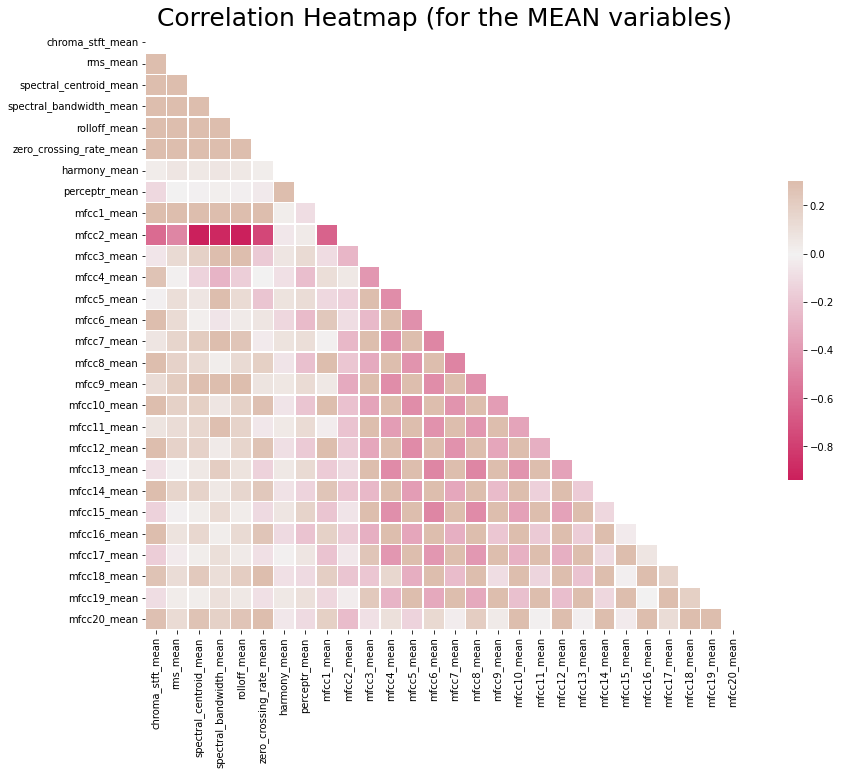

In [ ]:
# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]

# apply corr on spike_cols
corr = data[spike_cols].corr()

# print corr
print(corr)

# Generate a mask for the upper triangle using np.triu
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap using sns.diverging_palette
cmap = sns.diverging_palette(230, 20, as_cmap=True);

# Draw the heatmap with the mask and correct aspect ratio (vmax=.3, center=0,
            # square=True, linewidths=.5, cbar_kws={"shrink": .5})

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});



# plot the title of graph
plt.title("Correlation Heatmap", fontsize = 23);


# Get or set the current tick locations and labels of the x-axis
plt.xticks(rotation=90)

# Get or set the current tick locations and labels of the y-axis
plt.yticks(rotation=0)



# save the figure
plt.savefig("Corr Heatmap.jpg")


### Lets make a boxplot based on our classes

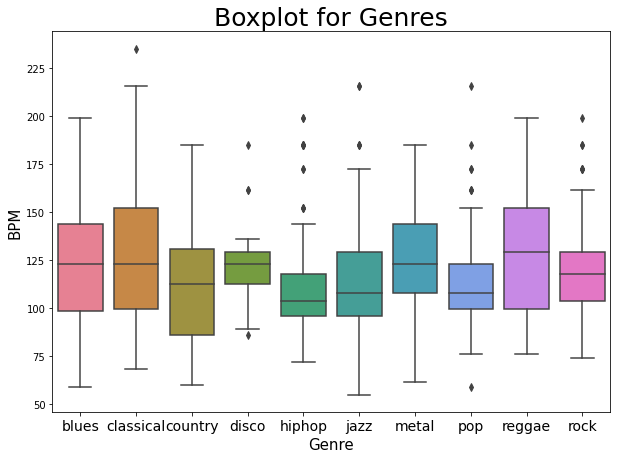

In [ ]:
# use label and tempo feature from dataframe
x = data['label']
y = data['tempo']

# set figure size
plt.figure(figsize = (16, 6))

# plot subplots
f, ax = plt.subplots(figsize=(10,7));
# plot boxplot and set x as label and y as temp
sns.boxplot(x=x, y=y, ax=ax);


# plot the title of graph
plt.title("BPM Boxplot", fontsize = 23);


# Get or set the current tick locations and labels of the x-axis
plt.xticks(rotation=90)


# Get or set the current tick locations and labels of the y-axis
plt.yticks(rotation=0)


# plot the x axis as "Genre"
plt.xlabel("Genre", fontsize = 23);


# plot the y axis as "BPM"
plt.ylabel("BPM", fontsize = 23);


# save the figure
plt.savefig("BPM Boxplot.jpg")

In [ ]:
# import the sklearn preprocessing library
from sklearn import preprocessing


# taking all rows and columns from 1st using iloc
data = data.iloc[:, 1:]

# print data
print(data)

# set the output feature "label" as y
y = label_encoder.fit_transform(y)

# print y
print(y)

# remove label from dataframe as we want to predict the label
X = data.drop('label', axis=1)

# print X
print(X)

# NORMALIZE
#Transform features by scaling each feature to a given range.
#This estimator scales and translates each feature individually such that it is in the given range on the training set, i.e. between zero and one.
cols = X.columns

# use MinMaxScaler to normalize the data
min_max_scaler = preprocessing.MinMaxScaler()

# fit transform min_max_scaler and pass X
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data.
X = pd.DataFrame(np_scaled, columns = cols)

# Fit to data, then transform it.
# Fits transformer to X and y with optional parameters fit_params and returns a transformed version of X.(use fit_transform)
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data.
X = pd.DataFrame(np_scaled, columns = cols)

# print X
print(X)

# convert np_scaled into dataframe
X = pd.DataFrame(np_scaled, columns = cols)

# print X
print(X)


#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

# Number of components to keep. if n_components is not set all components are kept:
pca = PCA(n_components=2)


#Fit and transform the model with X and apply the dimensionality reduction on X.
principalComponents = pca.fit_transform(X)

# print principalComponents
print(principalComponents)

# create a dataframe with 2 columns ['principal component 1', 'principal component 2']
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# print principalDf
print(principalDf)

# concatenate with target label
finalDf = pd.concat([principalDf, data[['label']]], axis = 1)

# print finalDf
print(finalDf)

# print explained_variance_ratio_ndarray of shape (n_components,)
print(pca.explained_variance_ratio_)
# Percentage of variance explained by each of the selected components.
# If n_components is not set then all components are stored and the sum of the ratios is equal to 1.0.





[0.2439355  0.21781804]


## Performing Principal Component Analysis(PCA) on all classes

Read more about matplotlib.pyplot from below

* https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot

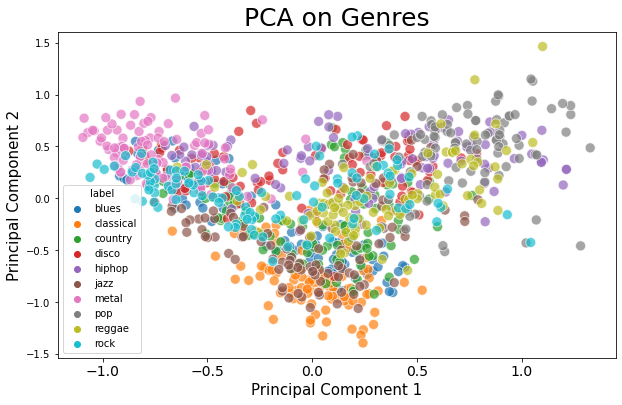

In [ ]:
# plot the figure using plt.plot()
plt.figure(figsize = (10,6))

# plot the scatter plot using - scatterplot
plt.scatter(finalDf['principal component 1'], finalDf['principal component 2'], c = label_encoder.fit_transform(finalDf['label']))


# set the title of graph
plt.title("PCA Scatter Plot", fontsize = 23);



# Get or set the current tick locations and labels of the x-axis.
plt.xticks(rotation=90)


# Get or set the current tick locations and labels of the y-axis.
plt.yticks(rotation=0)



# plot the label for x axis
plt.xlabel("Principal Component 1", fontsize = 23);



# plot the label for y axis
plt.ylabel("Principal Component 2", fontsize = 23);


# save the figure
plt.savefig("PCA Scattert.jpg")

#### Import all the classifier models that we are going to use.
#### Import sklearn libraries for measuring accuracy, confusion matrix, auc scores.

# Read these docs to know more about these libraries

* https://scikit-learn.org/stable/modules/neighbors.html#classification

* https://scikit-learn.org/stable/modules/tree.html#tree

* https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

* https://scikit-learn.org/stable/modules/sgd.html#sgd

* https://scikit-learn.org/stable/modules/svm.html#svm-classification

* https://scikit-learn.org/stable/modules/feature_selection.html#rfe



In [ ]:
# to perform online updates to model parameters via partial_fit import GaussianNB from sklear.naive_bayes
from sklearn.naive_bayes import GaussianNB


# import SGDClassifier and LogisticRegression
from sklearn.linear_model import SGDClassifier, LogisticRegression



# import k-nearest neighbors from sklearn
from sklearn.neighbors import KNeighborsClassifier


# import Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier


# import Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier


# import Support Vector Machine
from sklearn.svm import SVC


# import random Forest Classifier using sklearn
from sklearn.ensemble import RandomForestClassifier


# import MLPClassifier using sklearn
from sklearn.neural_network import MLPClassifier


# import SVC
from sklearn.svm import SVC


# import XGBClassifier
from xgboost import XGBClassifier


# import XGBRFClassifier
from xgboost import XGBRFClassifier


# using sklearn import MLPClassifier
from sklearn.neural_network import MLPClassifier


# import XGB Classifier and XGBRF Classifier
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier


# The XGBoost Python API provides a function for plotting decision trees within a trained XGBoost model.
from xgboost import plot_tree
# import plot_tree, plot_importance


# to plot confusion matrix , accuracy score roc auc score and roc curve using sklearn import necessary libraries
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns



# to preprocess the data using sklearn import preprocessing
from sklearn import preprocessing


# to train test split the data import train_test_split
from sklearn.model_selection import train_test_split


# import RFE
from sklearn.feature_selection import RFE



In [ ]:
# read the cvs file f'{general_path}/features_3_sec.csv', where we have our input dataset
data = pd.read_csv(f'{general_path}/features_3_sec.csv')

# choose all rows and cols from from first to all using iloc method on data
data = data.iloc[:, 1:]

# print data
print(data)

# display first 5 rows
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [ ]:
# extract label from data
y = data['label'] # genre variable.

# #select all columns but not the labels
X = data.loc[:, data.columns != 'label']

# print X
print(X)

# print y
print(y)

# NORMALIZE X
# Normalize so everything is on the same scale.

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

# fit transform min_max_scalerand pass X
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data.
X = pd.DataFrame(np_scaled, columns = cols)

# print X
print(X)

# display the top 5 rows
X.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,0.083164,0.204458,0.008479,0.627798,0.065750,0.558889,0.094009,0.398969,0.705797,0.053666,0.520907,0.049058,0.436564,0.087325,0.612386,0.077451,0.442464,0.092440,0.615847,0.079919,0.401687,0.049143,0.548711,0.143782,0.346570,0.182065,0.471486,0.188510,0.349726,0.089786,0.453269,0.074706,0.376489,0.046738,0.547239,0.050357,0.399156,0.066637,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,0.051694,0.220384,0.015719,0.627315,0.038963,0.556635,0.082431,0.375552,0.696756,0.044735,0.510794,0.040432,0.451290,0.055461,0.682923,0.060499,0.385907,0.083584,0.630069,0.082378,0.402853,0.135101,0.563791,0.094805,0.376837,0.145341,0.554920,0.102538,0.326362,0.071884,0.426042,0.066947,0.330153,0.040780,0.546890,0.050933,0.380825,0.108298,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,0.060820,0.173133,0.006448,0.628102,0.098196,0.567421,0.073998,0.375552,0.687860,0.083848,0.482928,0.048348,0.483199,0.045925,0.683410,0.061136,0.498369,0.076570,0.666625,0.069380,0.436689,0.122999,0.527851,0.089802,0.366354,0.271352,0.472968,0.059395,0.369542,0.062476,0.475571,0.059796,0.376549,0.058360,0.515473,0.030699,0.481771,0.078810,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,0.070906,0.167277,0.004587,0.629326,0.065471,0.564424,0.100660,0.375552,0.706313,0.055188,0.547621,0.063054,0.461877,0.025883,0.599954,0.078755,0.365562,0.086912,0.619799,0.133131,0.422114,0.092336,0.557104,0.126007,0.358830,0.158894,0.501274,0.071605,0.315785,0.077950,0.456012,0.064220,0.381356,0.093799,0.559949,0.041571,0.353526,0.069696,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,0.046916,0.169278,0.004355,0.630608,0.075828,0.556466,0.099061,0.375552,0.722236,0.046525,0.557220,0.040977,0.455376,0.040963,0.603178,0.043292,0.354883,0.059964,0.600390,0.083799,0.407559,0.061604,0.561470,0.086810,0.295722,0.210794,0.515745,0.108017,0.394926,0.072840,0.544897,0.071432,0.361231,0.068626,0.500581,0.024291,0.386226,0.061869,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713


In [ ]:
# splitting the data into train and test set with test_size=0.3, random_state=42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



Read [this](https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit) article to know more about model fitting and predictions

# **Create a function to fit, predict and print the accuracy of model**

In [ ]:
# create a function to fit the model and predict the result
def model_assess(model, title = "Default"):
  # fit the model
  model.fit(X_train, y_train)

  # predict
  preds = model.predict(X_test)

  # print the accuracy
  print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')



    # predict
    preds = model.predict(X_test)

    # print the accuracy
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [ ]:
# Naive Bayes
nb = GaussianNB()
# Calling the model_assess( model , "title name") function.
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter = 5000, tol=1e-3)
# Calling the model_assess( model , "title name") function.
model_assess(sgd, "Stochastic Gradient Descent")



# KNN
knn = KNeighborsClassifier(n_neighbors=19)
# Calling the model_assess( model , "title name") function.
model_assess(knn, "KNN")



# Decission trees
tree = DecisionTreeClassifier()
# Calling the model_assess( model , "title name") function.
model_assess(tree, "Decission trees")




# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
# Calling the model_assess( model , "title name") function.
model_assess(rforest, "Random Forest")



# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
# Calling the model_assess( model , "title name") function.
model_assess(svm, "Support Vector Machine")


# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
# Calling the model_assess( model , "title name") function.
model_assess(lg, "Logistic Regression")



# Neural Nets
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(150, 10), random_state=1)
# Calling the model_assess( model , "title name") function.
model_assess(nn, "Neural Nets")


# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
# Calling the model_assess( model , "title name") function.
model_assess(xgb, "Cross Gradient Booster")



# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
# Calling the model_assess( model , "title name") function.
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")


Accuracy Naive Bayes : 0.51952 

Accuracy Stochastic Gradient Descent : 0.65532 

Accuracy KNN : 0.80581 

Accuracy Decission trees : 0.63931 

Accuracy Random Forest : 0.81415 

Accuracy Support Vector Machine : 0.75409 

Accuracy Logistic Regression : 0.6977 

Accuracy Neural Nets : 0.67167 

Accuracy Cross Gradient Booster : 0.87988 

Accuracy Cross Gradient Booster (Random Forest) : 0.58859 



# **Choose the model with best accuracy from above models**

### **Here best model we got is Cross Gradient Booster with an accuracy of 87.988%**

Accuracy : 0.87988 



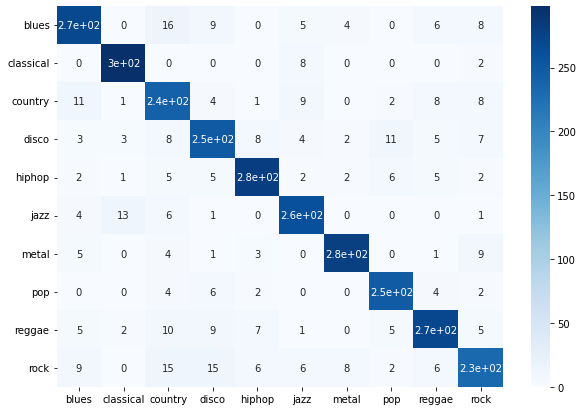

In [ ]:
# Final model
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)

# fit the model
xgb.fit(X_train, y_train)



# predict
preds = xgb.predict(X_test)

# print the accuracy
print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds)

# plot the figure with size 10x7
plt.figure(figsize = (10,7))
# plot the confusion matrix
sns.heatmap(confusion_matr, cmap="Blues", annot=True,
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);

# save the confusion matrix
plt.savefig("conf matrix")

# **Save the model as txt, json and pkl file**

In [ ]:
# saving the model in json format using save_model method
xgb.save_model("xgb.json")




# saving the model in txt format
xgb.save_model("xgb.txt")



# importing the pickle file
import pickle
# saving the pickle file with file name
file_name = "xgb.pkl"
# save the model in pickle format using pickle.dump
pickle.dump(xgb, open(file_name, "wb"))



# **loading the model**

In [ ]:
# load the model
xgb_model = pickle.load(open(file_name, "rb"))

In [ ]:
# Check first row of dataframe X
first_row = X.iloc[0]
first_row

length                     0.000000
chroma_stft_mean           0.355399
chroma_stft_var            0.716757
rms_mean                   0.293133
rms_var                    0.107955
spectral_centroid_mean     0.262173
spectral_centroid_var      0.034784
spectral_bandwidth_mean    0.459205
spectral_bandwidth_var     0.094130
rolloff_mean               0.346153
rolloff_var                0.083164
zero_crossing_rate_mean    0.204458
zero_crossing_rate_var     0.008479
harmony_mean               0.627798
harmony_var                0.065750
perceptr_mean              0.558889
perceptr_var               0.094009
tempo                      0.398969
mfcc1_mean                 0.705797
mfcc1_var                  0.053666
mfcc2_mean                 0.520907
mfcc2_var                  0.049058
mfcc3_mean                 0.436564
mfcc3_var                  0.087325
mfcc4_mean                 0.612386
mfcc4_var                  0.077451
mfcc5_mean                 0.442464
mfcc5_var                  0

In [ ]:
# check first 10 output of y_test
y_test[:10]



4022     hiphop
5412       jazz
487       blues
39        blues
6795      metal
9439       rock
7450        pop
2377    country
2407    country
483       blues
Name: label, dtype: object

# **Predicting the model**

In [ ]:
# predict 4th input on X_test
pred = xgb_model.predict(X_test)[3]
pred

'blues'

# **Create the function to predict the model**

In [ ]:
def model_predict(filepath, model):
    # predict
    preds = model.predict(filepath)

    # return preds
    return preds



# Lets check the model we created and predict some of test dataset

In [ ]:
# check the predictions for X_test[0]
model_predict(X_test ,xgb_model)[0]

'hiphop'

In [ ]:
# check the predictions for X_test[58]
model_predict(X_test ,xgb_model)[58]




'blues'

In [ ]:
# check the predictions for X_test[75]
model_predict(X_test ,xgb_model)[75]




'country'

In [ ]:
# check the predictions for X_test[46]
model_predict(X_test ,xgb_model)[46]




'hiphop'

#**Feature Importance**
* Training a model that accurately predicts outcomes is great, but most of the time you don't just need predictions, you want to be able to interpret your model.
* For example, if you build a model of house prices, knowing which features are most predictive of price tells us which features people are willing to pay for.
* Feature importance is the most useful interpretation tool, and data scientists regularly examine model parameters (such as the coefficients of linear models), to identify important features.
* Read this article on [Default Random forest importances](https://explained.ai/rf-importance/)

[eli5.permutation_importance](https://eli5.readthedocs.io/en/latest/autodocs/permutation_importance.html)

A module for computing feature importances by measuring how score decreases when a feature is not available. It contains basic building blocks; there is a full-featured sklearn-compatible implementation in PermutationImportance.

In [ ]:
# install eli5 library
!pip install eli5

     |████████████████████████████████| 106 kB 5.4 MB/s 


Go through this article for Permutation Importance:-  

https://www.kaggle.com/dansbecker/permutation-importance

* The ELI5 permutation importance takes a much more direct path of determining which features are important against a specific test set by systematically removing them (or more accurately, replacing them with random noise)
and measuring how this affects the model’s performance.  
* It works with both classification and regression models.

In [ ]:
# import eli5
import eli5


# import the PermutationImportance library from eli5.sklearn package
from eli5.sklearn import PermutationImportance



In [ ]:
# instantiate PermutationImportance with estimator=xgb & random_state=1
perm = PermutationImportance(xgb, random_state=1)


# fit the perm
perm.fit(X_test, y_test)

#  fit test data.
eli5.show_weights(perm, feature_names = X_test.columns.tolist())



# Return an explanation of estimator parameters (weights) as an IPython.display.HTML object. Use eli5.show_weights to show classifier weights in IPython





Weight,Feature
0.0902 ± 0.0090,perceptr_var
0.0493 ± 0.0067,perceptr_mean
0.0486 ± 0.0058,harmony_mean
0.0388 ± 0.0051,mfcc4_mean
0.0334 ± 0.0036,chroma_stft_mean
0.0266 ± 0.0038,harmony_var
0.0263 ± 0.0048,rms_var
0.0226 ± 0.0048,mfcc9_mean
0.0204 ± 0.0030,tempo
0.0187 ± 0.0037,mfcc11_mean


# **Building the Recommendation System**

In [ ]:
# # importing ipython.display to create an audio object.
import IPython.display as ipd



# When this object is returned by an input cell or passed to the display function,
# it will result in Audio controls being displayed in the frontend (only works in the notebook).
# import cosine_similarity for recommendations
from sklearn.metrics.pairwise import cosine_similarity



# import preprocessing
import numpy as np
from sklearn import preprocessing



In [ ]:
# Read data f'{general_path}/features_30_sec.csv', index_col='filename'
data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')

# display first 5 rows
data.head()

In [ ]:
# Extract labels
labels = data['label']

# Drop labels column
data = data.drop(columns=['label'])

# Drop columns=['length','label'] from original dataframe
data = data.drop(columns=['length','label'])

# head return top 5 rows in a dataframe
data.head()


,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035
blues.00001.wav,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282
blues.00002.wav,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025
blues.00003.wav,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339
blues.00004.wav,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160


[sklearn.preprocessing.scale](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing)

* Standardize a dataset along any axis.
* Center to the mean and component wise scale to unit variance.

In [ ]:
# Scale the data
data_scaled = preprocessing.scale(data)

# print the data type of data_scaled
print data_scaled.dtype



Scaled data type: <class 'numpy.ndarray'>


# **Cosine similarity**

[Cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity)
* It measures the similarity between two vectors of an inner product space.
* It is measured by the cosine of the angle between two vectors and determines whether two vectors are pointing in roughly the same direction.
* It is often used to measure document similarity in text analysis.




**Read this [article](https://neo4j.com/docs/graph-data-science/current/alpha-algorithms/cosine/#:~:text=Cosine%20similarity%20is%20the%20cosine,'%20lengths%20(or%20magnitudes)) before moving ahead:-**<br>


In [ ]:
# instantiate Cosine similarity and pass data_scaled
similarity = cosine_similarity(data_scaled)

# print the similarity shape
print(similarity.shape)

# print the similarity
print(similarity)

# Convert into a dataframe
sim_df_labels = pd.DataFrame(similarity, index=labels.index, columns=labels.index)

# display top 5 rows
sim_df_labels.head()

# and then set the index as labels.index
sim_df_names = pd.DataFrame(similarity, index=labels, columns=labels)

# set column names as labels.index
sim_df_names.head()



# display top 5 rows
sim_df_names.head()

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,blues.00010.wav,blues.00011.wav,blues.00012.wav,blues.00013.wav,blues.00014.wav,blues.00015.wav,blues.00016.wav,blues.00017.wav,blues.00018.wav,blues.00019.wav,blues.00020.wav,blues.00021.wav,blues.00022.wav,blues.00023.wav,blues.00024.wav,blues.00025.wav,blues.00026.wav,blues.00027.wav,blues.00028.wav,blues.00029.wav,blues.00030.wav,blues.00031.wav,blues.00032.wav,blues.00033.wav,blues.00034.wav,blues.00035.wav,blues.00036.wav,blues.00037.wav,blues.00038.wav,blues.00039.wav,...,rock.00060.wav,rock.00061.wav,rock.00062.wav,rock.00063.wav,rock.00064.wav,rock.00065.wav,rock.00066.wav,rock.00067.wav,rock.00068.wav,rock.00069.wav,rock.00070.wav,rock.00071.wav,rock.00072.wav,rock.00073.wav,rock.00074.wav,rock.00075.wav,rock.00076.wav,rock.00077.wav,rock.00078.wav,rock.00079.wav,rock.00080.wav,rock.00081.wav,rock.00082.wav,rock.00083.wav,rock.00084.wav,rock.00085.wav,rock.00086.wav,rock.00087.wav,rock.00088.wav,rock.00089.wav,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,-0.004725,-0.138701,0.022420,0.170770,-0.100287,-0.061984,0.038424,0.070591,-0.043250,-0.032994,0.506165,-0.103861,-0.153357,-0.021814,-0.068566,-0.103846,-0.286219,-0.017917,0.019182,-0.245793,-0.158164,-0.203505,-0.238364,-0.245459,-0.182820,0.016867,-0.108189,-0.377991,-0.102337,-0.288664,...,-0.180951,-0.357947,-0.499987,-0.583565,0.582948,0.455372,-0.117475,0.291773,0.535460,0.111680,-0.018038,0.616646,0.616184,0.619470,0.737537,0.391488,0.386102,0.524411,0.383944,0.635159,0.483003,0.338310,0.341182,0.704877,0.468150,-0.165756,-0.033461,0.655153,0.271846,0.484170,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,0.187969,0.537564,0.116593,0.138999,0.372891,0.339293,0.243391,0.293110,0.242766,0.350323,0.173128,0.374270,0.433072,0.041210,0.293562,0.208121,0.265333,0.069686,0.193576,0.315657,0.197519,0.174806,0.336295,0.264876,0.151645,0.155828,0.129249,0.296153,0.236439,0.296356,...,-0.292708,0.038637,-0.141359,0.418910,-0.177155,-0.108917,0.554469,0.031773,-0.153006,0.026416,-0.086265,-0.040695,-0.088279,-0.219520,-0.169743,0.043461,0.234076,-0.143892,0.226681,-0.234705,-0.254766,0.087614,-0.204128,-0.241611,-0.207278,0.031050,0.220761,-0.295174,-0.133969,0.047796,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,0.220436,0.057667,0.214217,0.026326,-0.174039,-0.091717,0.042537,0.056512,-0.294934,0.037617,0.287231,-0.181328,-0.235117,0.129427,-0.020690,-0.191341,-0.372636,-0.058686,0.120372,0.075361,0.216751,0.196171,0.082313,0.175337,0.256547,0.392760,0.325772,-0.130494,0.242670,0.045100,...,-0.386603,-0.475932,-0.462687,-0.531435,0.657971,0.434122,-0.034768,0.271837,0.451977,0.175507,0.234224,0.450491,0.417995,0.488881,0.503598,0.348458,0.357615,0.455360,0.404612,0.631893,0.443831,0.326861,0.241868,0.550154,0.420591,0.109318,0.109191,0.594156,0.192450,0.566140,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,0.339783,0.414037,0.103369,0.220996,0.224956,0.228406,0.042363,0.261825,0.065738,0.303616,0.225934,0.248292,0.260467,0.101586,0.330638,0.255722,0.167251,0.160013,0.378844,0.163240,0.115658,0.078846,0.199018,0.076584,0.028351,0.183075,0.142251,0.039

In [ ]:
# define find_similar_songs
def find_similar_songs(name):
    # Find songs most similar to another song using sim_df_names[name].sort_values method
    series = sim_df_names[name].sort_values(ascending = False)

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)

    # Display the 5 top matches
    print("\n\n We recommend you these songs based on your previous likings and input", name)
    print("\n ")
    # print top 5 songs on the recommendation list i.e. top 5 most similar songs
    print(series.head(5))

In [ ]:
# Enter the song name which you want to get recommendation for (ex pop.00003.wav), use find_similar_song function
find_similar_songs('pop.00003.wav')





 We recommend you these songs based on your previous likings and input pop.00003.wav

 
filename
country.00044.wav    0.630061
reggae.00093.wav     0.575888
hiphop.00043.wav     0.569438
hiphop.00059.wav     0.562819
reggae.00053.wav     0.555799
Name: pop.00003.wav, dtype: float64


In [ ]:
# We want to find the recommendation for this song input
ipd.Audio(f'{general_path}/genres_original/pop/pop.00003.wav')

## Predicting the audio recommendations we got above.

In [ ]:
# lets check the recommendations we got.
# recommendation-1
ipd.Audio(f'{general_path}/genres_original/pop/pop.00004.wav')




In [ ]:
# lets check the recommendations we got.
# recommendation-2
ipd.Audio(f'{general_path}/genres_original/pop/pop.00005.wav')



In [ ]:
# lets check the recommendations we got.
# recommendation-3
ipd.Audio(f'{general_path}/genres_original/pop/pop.00006.wav')



In [ ]:
# lets check the recommendations we got.
# recommendation-4
ipd.Audio(f'{general_path}/genres_original/pop/pop.00007.wav')



# **Now you know**
### 1. **Audio Visualization**
### 2. **Audio Preprocessing**
### 3. **Audio Classification**
### 4. **Audio Recommendation**


# **FEEDBACK FORM**

Please fill the form so that we can make our course better.

https://forms.zohopublic.in/cloudyml/form/CloudyMLDeepLearningFeedbackForm/formperma/VCFbldnXAnbcgAIl0lWv2blgHdSldheO4RfktMdgK7s